<a href="https://colab.research.google.com/github/naumankhokhar/Data-Mining-and-Machine-Learning/blob/main/Credit%20approval%20Machine%20learning%20Model%20-%20random%20forest%2C%20KNN%2C%20LR%2C%20DT%2C%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#(Part A) LOAN APPROVAL MODEL

##Task 1 - Domain Understanding Classification



###Retain other than approval_status & Max_Loan_amount
###1 Most important variable


1.   Payment default on File


###3 Most important variables


1.   LTI
2.   Income
3.   Employement Length


###+5 Most Important


1.   Age
2.   Loan Amount
3.   Education
4.   Home Ownership
5.   Loan Intent
6.   Loan Interest Rate

### To Drop
*   ID
*   Sex
*   Credit Application Acceptance





##Task 2 - Data Understanding: Producing Your Experimental Design

###1. From your Python notebook, for your RETAINED input variables and your class “target” variable, produce a basic statistical description and variable scale type. Plot the distribution of your target variable.

In [ ]:
#import libraries
import pandas as pd
import plotly.express as px

In [ ]:
#loading data
loan_OG = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_approval_data.csv')

/tmp/ipython-input-3977527226.py:2: DtypeWarning: Columns (1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_OG = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_approval_data.csv')


In [ ]:
#DO NOT RUN
#check original dataset
loan_work = loan_OG.copy()
loan_work.head()

,id,age,Sex,Education_Qualifications,income,home_ownership,emplyment_length,loan_intent,loan_amount,loan_interest_rate,loan_income_ratio,payment_default_on_file,credit_history_length,loan_approval_status,max_allowed_loan,Credit_Application_Acceptance
0,35437,21.0,M,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900,0.0
1,53756,21.0,M,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739,0.0
2,42205,23.0,M,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000,0.0
3,19180,40.0,M,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000,0.0
4,28072,40.0,M,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000,0.0


In [ ]:
#columns
list(loan_work.columns)
loan_work.info()
loan_work.describe(include='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             58645 non-null  int64  
 1   age                            58639 non-null  object 
 2   Sex                            221 non-null    object 
 3   Education_Qualifications       58645 non-null  object 
 4   income                         58645 non-null  int64  
 5   home_ownership                 58645 non-null  object 
 6   emplyment_length               58645 non-null  int64  
 7   loan_intent                    58645 non-null  object 
 8   loan_amount                    58645 non-null  int64  
 9   loan_interest_rate             58634 non-null  float64
 10  loan_income_ratio              58645 non-null  float64
 11  payment_default_on_file        58640 non-null  object 
 12  credit_history_length          58645 non-null 

,age,Sex,Education_Qualifications,home_ownership,loan_intent,payment_default_on_file,loan_approval_status
count,58639.0,221,58645,58645,58645,58640,58644
unique,104.0,2,6,4,6,4,8
top,22.0,M,Unknown,RENT,EDUCATION,N,Approved
freq,5903.0,126,58303,30594,12271,49933,50210


In [ ]:
loan_work.shape

(58645, 16)

In [ ]:
loan_work.to_csv(r'/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work', index=False)
loan_work.head()

,id,age,Sex,Education_Qualifications,income,home_ownership,emplyment_length,loan_intent,loan_amount,loan_interest_rate,loan_income_ratio,payment_default_on_file,credit_history_length,loan_approval_status,max_allowed_loan,Credit_Application_Acceptance
0,35437,21.0,M,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900,0.0
1,53756,21.0,M,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739,0.0
2,42205,23.0,M,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000,0.0
3,19180,40.0,M,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000,0.0
4,28072,40.0,M,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000,0.0


In [ ]:
#columns
list(loan_work.columns)
loan_work.info()
loan_work.describe(include='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             58645 non-null  int64  
 1   age                            58639 non-null  object 
 2   Sex                            221 non-null    object 
 3   Education_Qualifications       58645 non-null  object 
 4   income                         58645 non-null  int64  
 5   home_ownership                 58645 non-null  object 
 6   emplyment_length               58645 non-null  int64  
 7   loan_intent                    58645 non-null  object 
 8   loan_amount                    58645 non-null  int64  
 9   loan_interest_rate             58634 non-null  float64
 10  loan_income_ratio              58645 non-null  float64
 11  payment_default_on_file        58640 non-null  object 
 12  credit_history_length          58645 non-null 

,age,Sex,Education_Qualifications,home_ownership,loan_intent,payment_default_on_file,loan_approval_status
count,58639.0,221,58645,58645,58645,58640,58644
unique,104.0,2,6,4,6,4,8
top,22.0,M,Unknown,RENT,EDUCATION,N,Approved
freq,5903.0,126,58303,30594,12271,49933,50210


In [ ]:
#remove columns: id, sex and credit application acceptance using drop
loan_work.drop(['id', 'Sex', 'Credit_Application_Acceptance'], axis=1, inplace=True)

In [ ]:
#columns has been removed
list(loan_work.columns)
loan_work.info()
loan_work.describe(include='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58639 non-null  object 
 1   Education             58645 non-null  object 
 2   Income                58645 non-null  int64  
 3   Home                  58645 non-null  object 
 4   Job Tenure            58645 non-null  int64  
 5   Purpose               58645 non-null  object 
 6   Loan Amount           58645 non-null  int64  
 7   Loan Interest Rate    58634 non-null  float64
 8   Loan-Income Ratio     58645 non-null  float64
 9   Payment Default Stat  58640 non-null  object 
 10  Credit History        58645 non-null  int64  
 11  Loan Approval         58644 non-null  object 
 12  Max Amount of Loan    58645 non-null  int64  
dtypes: float64(2), int64(5), object(6)
memory usage: 5.8+ MB


,Age,Education,Home,Purpose,Payment Default Stat,Loan Approval
count,58639.0,58645,58645,58645,58640,58644
unique,104.0,6,4,6,4,8
top,22.0,Unknown,RENT,EDUCATION,N,Approved
freq,5903.0,58303,30594,12271,49933,50210


In [ ]:
#rename column
loan_work.rename({'age':"Age", 'Education_Qualifications':"Education", 'income':"Income", 'home_ownership':"Home", 'emplyment_length': "Job Tenure", 'loan_intent':"Purpose", 'loan_amount': "Loan Amount",  'loan_interest_rate': "Loan Interest Rate", 'loan_income_ratio': "Loan-Income Ratio", 'payment_default_on_file':"Payment Default Stat", 'credit_history_length': "Credit History", 'loan_approval_status' : "Loan Approval", 'max_allowed_loan':"Max Amount of Loan"}, axis=1, inplace=True)
loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000


In [ ]:
#see missing values
loan_work.isnull().sum()
loan_work.isna().sum()/len(loan_work)*100

,0
Age,0.010231
Education,0.000000
Income,0.000000
Home,0.000000
Job Tenure,0.000000
Purpose,0.000000
Loan Amount,0.000000
Loan Interest Rate,0.018757
Loan-Income Ratio,0.000000
Payment Default Stat,0.008526


In [ ]:
#save these changes in the loan_work.csv file in drive
loan_work

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,32,Unknown,1200000,MORTGAGE,16,DEBTCONSOLIDATION,16000,6.92,0.13,N,5,Approved,1903960
58641,32,Unknown,1200000,RENT,2,PERSONAL,10000,7.51,0.01,N,9,Approved,1909968
58642,22,Unknown,1900000,MORTGAGE,6,EDUCATION,1500,15.62,0.00,Y,3,Approved,2088491
58643,25,Unknown,1839784,RENT,0,VENTURE,8000,8.00,0.04,N,3,Approved,2291708


#Task 2
From your Python notebook, for your RETAINED input variables and your class “target” variable, produce a basic statistical description and variable scale type. Plot the distribution of your target variable. (Paste screenshots of code OUTPUTS ONLY for evidence).

In [ ]:
loan_work.describe()

,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Credit History,Max Amount of Loan
count,5.864500e+04,58645.000000,58645.000000,58634.000000,58645.000000,58645.000000,5.864500e+04
mean,6.404617e+04,4.703487,9217.556518,10.685988,0.159238,5.813556,2.823538e+05
std,3.793111e+04,4.004982,5563.807384,3.161955,0.091692,4.029196,5.148478e+07
min,4.200000e+03,0.000000,500.000000,-11.140000,0.000000,2.000000,-2.426900e+06
25%,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,3.800300e+04
50%,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,6.239200e+04
75%,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,9.271600e+04
max,1.900000e+06,150.000000,35000.000000,150.000000,0.830000,30.000000,1.246799e+10


In [ ]:
loan_work.describe()

,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Credit History,Max Amount of Loan
count,5.864500e+04,58645.000000,58645.000000,58634.000000,58645.000000,58645.000000,5.864500e+04
mean,6.404617e+04,4.703487,9217.556518,10.685988,0.159238,5.813556,2.823538e+05
std,3.793111e+04,4.004982,5563.807384,3.161955,0.091692,4.029196,5.148478e+07
min,4.200000e+03,0.000000,500.000000,-11.140000,0.000000,2.000000,-2.426900e+06
25%,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,3.800300e+04
50%,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,6.239200e+04
75%,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,9.271600e+04
max,1.900000e+06,150.000000,35000.000000,150.000000,0.830000,30.000000,1.246799e+10


## V1 -> payment_detault_on_file


In [ ]:
loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000


In [ ]:
#Payment Default Stat - Unique
loan_work['Payment Default Stat'].unique()

array(['N', 'Y', nan, 'NO', 'YES'], dtype=object)

In [ ]:
#plot histogram


In [ ]:
defaulter = px.histogram(loan_work, x='Payment Default Stat')
defaulter.show()

In [ ]:
loan_work['Payment Default Stat'] = loan_work['Payment Default Stat'].replace({'NO': 'N', 'YES': 'Y'})
loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,N,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,Y,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,N,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,N,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,N,14,Approved,35000


In [ ]:
# Map 'Y' with 1 and 'N' with 0 in 'Payment Default Stat'
loan_work['Payment Default Stat'] = loan_work['Payment Default Stat'].map({'Y': 1, 'N': 0})
loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,0.0,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,1.0,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,0.0,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,0.0,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,0.0,14,Approved,35000


In [ ]:
#Payment Default Stat - Unique
loan_work['Payment Default Stat'].unique()

<IntegerArray>
[0, 1]
Length: 2, dtype: Int64

In [ ]:
#convert the NA data to 0
loan_work['Payment Default Stat'] = loan_work['Payment Default Stat'].fillna(0)
loan_work.head

<bound method NDFrame.head of         Age Education   Income      Home  Job Tenure            Purpose  \
0      21.0  Unknown     12000       OWN           0          EDUCATION   
1      21.0  Unknown     13200       OWN           2          EDUCATION   
2      23.0  Unknown      9600      RENT           5            MEDICAL   
3      40.0  Unknown    182004      RENT           3          EDUCATION   
4      40.0  Unknown     90000  MORTGAGE           3    HOMEIMPROVEMENT   
...     ...       ...      ...       ...         ...                ...   
58640    32   Unknown  1200000  MORTGAGE          16  DEBTCONSOLIDATION   
58641    32   Unknown  1200000      RENT           2           PERSONAL   
58642    22   Unknown  1900000  MORTGAGE           6          EDUCATION   
58643    25   Unknown  1839784      RENT           0            VENTURE   
58644    29   Unknown  1824000  MORTGAGE           8  DEBTCONSOLIDATION   

       Loan Amount  Loan Interest Rate  Loan-Income Ratio  \
0            15000                6.99               0.12   
1            25000               16.77               0.19   
2            30000               12.42               0.31   
3            35000                8.00               0.19   
4            35000               12.42               0.39   
...            ...                 ...                ...   
58640        16000                6.92               0.13   
58641        10000                7.51               0.01   
58642         1500               15.62               0.00   
58643         8000                8.00               0.04   
58644         6000               13.99               0.03   

       Payment Default Stat  Credit History Loan Approval  Max Amount of Loan  
0                         0               4      Approved            -2426900  
1                         1               3      Approved             -111739  
2                         0               3      Approved              -89000  
3                         0              11      Approved               35000  
4                         0              14      Approved               35000  
...                     ...             ...           ...                 ...  
58640                     0               5      Approved             1903960  
58641                     0               9      Approved             1909968  
58642                     1               3      Approved             2088491  
58643                     0               3      Approved             2291708  
58644                     0               6      Approved             2638778  

[58645 rows x 13 columns]>

In [ ]:
# Change the variable type to numerical (nullable integer to handle NaN)
loan_work['Payment Default Stat'] = loan_work['Payment Default Stat'].astype('Int64')
loan_work.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58639 non-null  object 
 1   Education             58645 non-null  object 
 2   Income                58645 non-null  int64  
 3   Home                  58645 non-null  object 
 4   Job Tenure            58645 non-null  int64  
 5   Purpose               58645 non-null  object 
 6   Loan Amount           58645 non-null  int64  
 7   Loan Interest Rate    58634 non-null  float64
 8   Loan-Income Ratio     58645 non-null  float64
 9   Payment Default Stat  58645 non-null  Int64  
 10  Credit History        58645 non-null  int64  
 11  Loan Approval         58644 non-null  object 
 12  Max Amount of Loan    58645 non-null  int64  
dtypes: Int64(1), float64(2), int64(5), object(5)
memory usage: 5.9+ MB


In [ ]:
defaulter = px.histogram(loan_work, x='Payment Default Stat')
defaulter.show()

#change that in dataset


In [ ]:
loan_work.describe()

,Age,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Max Amount of Loan
count,58594.0,5.859400e+04,58594.000000,58594.000000,58583.000000,58594.000000,58594.000000,58594.000000,5.859400e+04
mean,27.514831,6.404253e+04,4.704458,9217.608919,10.685518,0.159240,0.148411,5.798665,2.825351e+05
std,5.902862,3.792264e+04,4.003414,5563.268759,3.161937,0.091698,0.355510,3.996239,5.150718e+07
min,20.0,4.200000e+03,0.000000,500.000000,-11.140000,0.000000,0.000000,2.000000,-2.426900e+06
25%,23.0,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,3.802825e+04
50%,26.0,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,6.242400e+04
75%,30.0,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,9.271300e+04
max,64.0,1.900000e+06,150.000000,35000.000000,150.000000,0.830000,1.000000,30.000000,1.246799e+10


In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

label_encoder = preprocessing.LabelEncoder()
loan_work['Payment Default Stat']= label_encoder.fit_transform(loan_work['Payment Default Stat'])

loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21.0,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,0,4,Approved,-2426900
1,21.0,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,1,3,Approved,-111739
2,23.0,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,0,3,Approved,-89000
3,40.0,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,0,11,Approved,35000
4,40.0,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,0,14,Approved,35000


In [ ]:
# Save the updated loan_work DataFrame back to the CSV file
loan_work.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_work.csv', index=False)
print("loan_work DataFrame, including 'Payment Default Stat' column, has been updated and saved to the CSV file.")

loan_work DataFrame, including 'Payment Default Stat' column, has been updated and saved to the CSV file.


In [ ]:
#check unique value of payment default stat
loan_work['Payment Default Stat'].unique()

array([0, 1])

In [ ]:
loan_work.isna().sum()/len(loan_work)*100

,0
Age,0.010231
Education,0.000000
Income,0.000000
Home,0.000000
Job Tenure,0.000000
Purpose,0.000000
Loan Amount,0.000000
Loan Interest Rate,0.018757
Loan-Income Ratio,0.000000
Payment Default Stat,0.000000


In [ ]:
#histogram of payment default stat
defaulter = px.histogram(loan_work, x='Payment Default Stat')
defaulter.show()

In [ ]:
#data type of Payment Default Stat
loan_work['Payment Default Stat'].dtype

dtype('int64')

In [ ]:
#describe stats of payment default
loan_work.describe()

,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Max Amount of Loan
count,5.864500e+04,58645.000000,58645.000000,58634.000000,58645.000000,58645.00000,58645.000000,5.864500e+04
mean,6.404617e+04,4.703487,9217.556518,10.685988,0.159238,0.14835,5.813556,2.823538e+05
std,3.793111e+04,4.004982,5563.807384,3.161955,0.091692,0.35545,4.029196,5.148478e+07
min,4.200000e+03,0.000000,500.000000,-11.140000,0.000000,0.00000,2.000000,-2.426900e+06
25%,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,0.00000,3.000000,3.800300e+04
50%,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,0.00000,4.000000,6.239200e+04
75%,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,0.00000,8.000000,9.271600e+04
max,1.900000e+06,150.000000,35000.000000,150.000000,0.830000,1.00000,30.000000,1.246799e+10


In [ ]:
#

#AGE

In [ ]:
#info of the age column using sumna len
loan_work['Age'].info()
#show me the rows number for float, numeric, array, negative and nan separately


Rows with NaN 'Age' values (6 instances):
[7461, 10456, 14459, 29241, 49227, 49298]


TypeError: '<' not supported between instances of 'str' and 'int'

In [ ]:
#list the valus of column age
loan_work['Age'].unique()

array([21.0, 23.0, 40.0, 20.0, 22.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0,
       30.0, 31.0, 32.0, 33.0, nan, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0,
       41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0,
       52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 61.0, 62.0, 64.0,
       65.0, 66.0, 70.0, 73.0, 76.0, 80.0, 69.0, '23', '27', '29', '25',
       '39', '22', '33', '31', '35', '26', '37', '34', '28', '21', '24',
       '46', '47', '41', '30', '49', '43', '42', '45', '38', '32', '51',
       '53', '36', '48', '52', '44', '57', '54', '62', '56', '20', '61',
       '55', '60', '58', '64', '70', '50', '59', '69', '123', '65', '66',
       '156', '-30', 'Twenty Seven', 'Twenty Three', 'Thirty', '84'],
      dtype=object)

In [ ]:
#find nan instance in the column age
loan_work[loan_work['Age'].isna()]
# Dictionary to map specific alphabetic age values to their numerical equivalents
alphabetic_age_map = {
    'Twenty Seven': 27,
    'Twenty Three': 23,
    'Thirty': 30,
    # Add any other alphabetic age mappings you find here
}
# Use .replace() to substitute alphabetic strings with their numerical counterparts
# Values not in the 'alphabetic_age_map' (including existing numbers and NaN) will be unchanged by this step.
loan_work['Age'] = loan_work['Age'].replace(alphabetic_age_map)

# Now, convert the entire 'Age' column to a numeric data type.
# pd.to_numeric will convert numerical strings (e.g., '21.0', '23', '123') to actual numbers.
# 'errors="coerce"' is crucial: it will turn any value that *cannot* be converted to a number (e.g., unrecognized text or original NaN) into a NaN.
# This ensures that only actual numerical values are affected, while non-convertible items become NaNs, effectively preserving other values by converting them to a standardized missing representation.
loan_work['Age'] = pd.to_numeric(loan_work['Age'], errors='coerce')

loan_work['Age'].unique()

array([ 21.,  23.,  40.,  20.,  22.,  24.,  25.,  26.,  27.,  28.,  29.,
        30.,  31.,  32.,  33.,  nan,  34.,  35.,  36.,  37.,  38.,  39.,
        41.,  42.,  43.,  44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,
        52.,  53.,  54.,  55.,  56.,  57.,  58.,  60.,  61.,  62.,  64.,
        65.,  66.,  70.,  73.,  76.,  80.,  69.,  59., 123., 156., -30.,
        84.])

In [ ]:
#find nan instance in the column age
loan_work[loan_work['Age'].isna()]

loan_work.describe()
#find the median value of the age
median_age = loan_work['Age'].median()
print(median_age)

#fill the nan values with the median age using fillna
loan_work['Age'].fillna(median_age, inplace=True)
loan_work.describe()

#show age histogram and outliers in form of bins
import plotly.express as px
age = px.histogram(loan_work, x='Age')
age.show()

In [ ]:
# Convert the 'Age' column to nullable integer type (Int64)
# This converts float numbers to integers and preserves NaN values.
loan_work['Age'] = loan_work['Age'].astype('Int64')

# Display unique values and info to confirm the conversion
print("Unique values in 'Age' column after conversion to Int64:")
print(loan_work['Age'].unique())
print("\nInfo for 'Age' column after conversion:")
loan_work['Age'].info()

Unique values in 'Age' column after conversion to Int64:
<IntegerArray>
[ 21,  23,  40,  20,  22,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,
  34,  35,  36,  37,  38,  39,  41,  42,  43,  44,  45,  46,  47,  48,  49,
  50,  51,  52,  53,  54,  55,  56,  57,  58,  60,  61,  62,  64,  65,  66,
  70,  73,  76,  80,  69,  59, 123, 156, -30,  84]
Length: 55, dtype: Int64

Info for 'Age' column after conversion:
<class 'pandas.core.series.Series'>
RangeIndex: 58645 entries, 0 to 58644
Series name: Age
Non-Null Count  Dtype
--------------  -----
58645 non-null  Int64
dtypes: Int64(1)
memory usage: 515.6 KB


In [ ]:
# Count values in 'Age' that are less than 0
negative_age_count = loan_work[loan_work['Age'] < 0]['Age'].count()

print(f"Number of values in 'Age' that are less than 0: {negative_age_count}")

Number of values in 'Age' that are less than 0: 1


In [ ]:
#drop the instance with negative value
loan_work = loan_work[loan_work['Age'] >= 0]
#show age unique
loan_work['Age'].unique()

<IntegerArray>
[ 21,  23,  40,  20,  22,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,
  34,  35,  36,  37,  38,  39,  41,  42,  43,  44,  45,  46,  47,  48,  49,
  50,  51,  52,  53,  54,  55,  56,  57,  58,  60,  61,  62,  64,  65,  66,
  70,  73,  76,  80,  69,  59, 123, 156,  84]
Length: 54, dtype: Int64

In [ ]:
#show histogram
loan_OG = pd.read_csv('//content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_approval_data.csv')
Loan_age = px.histogram(loan_OG x='age')
Loan_age.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (ipython-input-1713957806.py, line 3)

In [ ]:
#show histogram
age = px.histogram(loan_work, x='Age')
age.show()

In [ ]:
#identify the outliers using bins, frequency, boxplotting, whiskers and finding out the data loss
import matplotlib.pyplot as plt

In [ ]:
# Remove ages between 0 and 18, keeping the rest of the data
# Keep rows where age is strictly greater than 18
loan_work = loan_work[loan_work['Age'] > 18]

# Display the new shape of the DataFrame to show how many rows were removed
print(f"New DataFrame shape after removing ages 0-18: {loan_work.shape}")

#Remove the ages from 65+ from the age column
loan_work = loan_work[loan_work['Age'] < 65]

#show me how many rows have you removed after these two prunings
print(f"New DataFrame shape after removing ages 65+: {loan_work.shape}")



New DataFrame shape after removing ages 0-18: (58594, 13)
New DataFrame shape after removing ages 65+: (58594, 13)


In [ ]:
loan_work.describe()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Max Loan Amount
count,58551.000000,58551.000000,58551.000000,58551.000000,58540.000000,58551.000000,58551.000000,58551.000000,5.855100e+04
mean,27.512135,63530.673789,4.702960,9216.930573,10.686080,0.159332,0.148469,5.797834,2.819337e+05
std,5.901855,31419.528796,4.002416,5562.713766,3.162352,0.091662,0.355567,3.995959,5.152608e+07
min,20.000000,5000.000000,0.000000,500.000000,-11.140000,0.000000,0.000000,2.000000,-2.426900e+06
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,3.798700e+04
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,6.238000e+04
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,9.252700e+04
max,64.000000,400000.000000,150.000000,35000.000000,150.000000,0.830000,1.000000,30.000000,1.246799e+10


# Task
Calculate and print the 1st quartile (Q1), median (Q2), and 3rd quartile (Q3) for the 'Age' column. Generate a frequency distribution histogram for the 'Age' column with approximately 2-year bins. Create a box plot for the 'Age' column to visualize quartiles, whiskers, and outliers. Finally, quantify the exact count of age values considered outliers based on the calculated quartiles and Interquartile Range, and report the percentage of data these outliers represent.

## Calculate Age Quartiles

### Subtask:
Calculate and print the 1st quartile (Q1), median (Q2), and 3rd quartile (Q3) for the 'Age' column to understand its central tendency and spread. These values are crucial for defining box plot whiskers.


**Reasoning**:
To understand the central tendency and spread of the 'Age' column, I need to calculate its 1st quartile (Q1), median (Q2), and 3rd quartile (Q3) using pandas methods.



In [ ]:
Q1_age = loan_work['Age'].quantile(0.25)
Q2_age = loan_work['Age'].median()
Q3_age = loan_work['Age'].quantile(0.75)

print(f"1st Quartile (Q1) of Age: {Q1_age}")
print(f"Median (Q2) of Age: {Q2_age}")
print(f"3rd Quartile (Q3) of Age: {Q3_age}")

1st Quartile (Q1) of Age: 23.0
Median (Q2) of Age: 26.0
3rd Quartile (Q3) of Age: 30.0


**Reasoning**:
To visualize the distribution of the 'Age' column and understand its frequency across different age ranges, I will generate a histogram with approximately 2-year bins using `plotly.express`.



In [ ]:
age_histogram = px.histogram(loan_work, x='Age', nbins=round(loan_work['Age'].max() / 2), title='Distribution of Age with 2-Year Bins')
age_histogram.show()

**Reasoning**:
To visually represent the quartiles, whiskers, and potential outliers in the 'Age' column, I will create a box plot using `plotly.express`.



In [ ]:
age_boxplot = px.box(loan_work, y='Age', title='Box Plot of Age with Outliers')
age_boxplot.show()
#show the ages on x and frequency on y



In [ ]:
loan_work.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_work.csv', index=False)
print("loan_work DataFrame, including 'Age' column, has been updated and saved to the CSV file.")

loan_work DataFrame, including 'Age' column, has been updated and saved to the CSV file.


In [ ]:
# Create a histogram for the 'Age' column with approximately 2-year bins and a marginal box plot
age_combined_plot = px.histogram(
    loan_work,
    x='Age',
    nbins=round(loan_work['Age'].max() / 2),
    title='Combined Distribution of Age with 2-Year Bins and Marginal Box Plot',
    marginal='box',  # Add a marginal box plot
    labels={'Age': 'Age (Years)', 'count': 'Frequency'}  # Customize labels
)

age_combined_plot.show()

#Education Qualifications


In [ ]:
loan_work.info()
loan_work.describe(include='object')

<class 'pandas.core.frame.DataFrame'>
Index: 58594 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58594 non-null  Int64  
 1   Education             58594 non-null  object 
 2   Income                58594 non-null  int64  
 3   Home                  58594 non-null  object 
 4   Job Tenure            58594 non-null  int64  
 5   Purpose               58594 non-null  object 
 6   Loan Amount           58594 non-null  int64  
 7   Loan Interest Rate    58583 non-null  float64
 8   Loan-Income Ratio     58594 non-null  float64
 9   Payment Default Stat  58594 non-null  int64  
 10  Credit History        58594 non-null  int64  
 11  Loan Approval         58593 non-null  object 
 12  Max Amount of Loan    58594 non-null  int64  
dtypes: Int64(1), float64(2), int64(6), object(4)
memory usage: 6.3+ MB


,Education,Home,Purpose,Loan Approval
count,58594,58594,58594,58593
unique,6,4,6,8
top,Unknown,RENT,EDUCATION,Approved
freq,58252,30561,12267,50168


In [ ]:
#show me the head of loan work
loan_work.head()

,Age,Education,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21,Unknown,12000,OWN,0,EDUCATION,15000,6.99,0.12,0,4,Approved,-2426900
1,21,Unknown,13200,OWN,2,EDUCATION,25000,16.77,0.19,1,3,Approved,-111739
2,23,Unknown,9600,RENT,5,MEDICAL,30000,12.42,0.31,0,3,Approved,-89000
3,40,Unknown,182004,RENT,3,EDUCATION,35000,8.00,0.19,0,11,Approved,35000
4,40,Unknown,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,0,14,Approved,35000


In [ ]:
#show me the unique values of education
loan_work['Education'].unique()
#merge the 'Unknown ' and 'Uknown' to just one 'Unknown'
loan_work['Education'] = loan_work['Education'].replace({'Unknown ': 'Unknown', 'Uknown': 'Unknown'})
#show unique
loan_work['Education'].unique()

array(['Unknown', 'Higher Education', 'College', 'High School',
       'Apprenticeship '], dtype=object)

In [ ]:
#what percentage of rows has unknown education
unknown_education_percentage = (loan_work['Education'] == 'Unknown').mean()
print(f"Percentage of rows with 'Unknown' education: {unknown_education_percentage * 100:.2f}%")

Percentage of rows with 'Unknown' education: 99.76%


In [ ]:
#show info
loan_work.describe(include='object')


,Education,Home,Purpose,Loan Approval
count,58594,58594,58594,58593
unique,5,4,6,8
top,Unknown,RENT,EDUCATION,Approved
freq,58456,30561,12267,50168


In [ ]:
#drop education using dropna
loan_work.dropna(subset=['Education'], inplace=True)
loan_work.describe(include='object')
loan_work.head()
#drop education variable from the loan_work and update the file
loan_work.drop('Education', axis=1, inplace=True)
loan_work.head()

,Age,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
0,21,12000,OWN,0,EDUCATION,15000,6.99,0.12,0,4,Approved,-2426900
1,21,13200,OWN,2,EDUCATION,25000,16.77,0.19,1,3,Approved,-111739
2,23,9600,RENT,5,MEDICAL,30000,12.42,0.31,0,3,Approved,-89000
3,40,182004,RENT,3,EDUCATION,35000,8.00,0.19,0,11,Approved,35000
4,40,90000,MORTGAGE,3,HOMEIMPROVEMENT,35000,12.42,0.39,0,14,Approved,35000


In [ ]:
#using label encoder function from sklearn library, transform the instaces into numeric values


#Income

In [ ]:
loan_work.info()
loan_work.describe()
#write the values of describe in

<class 'pandas.core.frame.DataFrame'>
Index: 58594 entries, 0 to 58644
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58594 non-null  Int64  
 1   Income                58594 non-null  int64  
 2   Home                  58594 non-null  object 
 3   Job Tenure            58594 non-null  int64  
 4   Purpose               58594 non-null  object 
 5   Loan Amount           58594 non-null  int64  
 6   Loan Interest Rate    58583 non-null  float64
 7   Loan-Income Ratio     58594 non-null  float64
 8   Payment Default Stat  58594 non-null  int64  
 9   Credit History        58594 non-null  int64  
 10  Loan Approval         58593 non-null  object 
 11  Max Amount of Loan    58594 non-null  int64  
dtypes: Int64(1), float64(2), int64(6), object(3)
memory usage: 5.9+ MB


,Age,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Max Amount of Loan
count,58594.0,5.859400e+04,58594.000000,58594.000000,58583.000000,58594.000000,58594.000000,58594.000000,5.859400e+04
mean,27.514831,6.404253e+04,4.704458,9217.608919,10.685518,0.159240,0.148411,5.798665,2.825351e+05
std,5.902862,3.792264e+04,4.003414,5563.268759,3.161937,0.091698,0.355510,3.996239,5.150718e+07
min,20.0,4.200000e+03,0.000000,500.000000,-11.140000,0.000000,0.000000,2.000000,-2.426900e+06
25%,23.0,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,3.802825e+04
50%,26.0,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,6.242400e+04
75%,30.0,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,9.271300e+04
max,64.0,1.900000e+06,150.000000,35000.000000,150.000000,0.830000,1.000000,30.000000,1.246799e+10


In [ ]:
#show the histogram of income
income = px.histogram(loan_work, x='Income')
income.show()

In [ ]:
#show the scatter of income
income = px.box(loan_work, x='Income')
income.show()

In [ ]:

#how many instances has income more than 1.2M
ultra_rich = loan_work[loan_work['Income'] > 1200000]['Income'].count()
print(f"Number of ultra richies: {ultra_rich}")
#drop instance who's income > 948K

loan_work = loan_work[loan_work['Income'] <= 1900000]
income = px.box(loan_work, x='Income')
income.show()

Number of ultra richies: 0


In [ ]:
loan_work['Income'] = loan_work['Income'].clip(lower=5000, upper=500000)

print("Descriptive statistics for 'Income' after clipping:")
print(loan_work['Income'].describe())

Descriptive statistics for 'Income' after clipping:
count     58589.000000
mean      63807.241649
std       33236.054609
min        5000.000000
25%       42000.000000
50%       58000.000000
75%       75600.000000
max      500000.000000
Name: Income, dtype: float64


In [ ]:
#change data type integer
loan_work['Income'] = loan_work['Income'].astype(int)
loan_work.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58589 entries, 0 to 58639
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58589 non-null  Int64  
 1   Income                58589 non-null  int64  
 2   Home                  58589 non-null  object 
 3   Job Tenure            58589 non-null  int64  
 4   Purpose               58589 non-null  object 
 5   Loan Amount           58589 non-null  int64  
 6   Loan Interest Rate    58578 non-null  float64
 7   Loan-Income Ratio     58589 non-null  float64
 8   Payment Default Stat  58589 non-null  int64  
 9   Credit History        58589 non-null  int64  
 10  Loan Approval         58588 non-null  object 
 11  Max Amount of Loan    58589 non-null  int64  
dtypes: Int64(1), float64(2), int64(6), object(3)
memory usage: 5.9+ MB


In [ ]:
income = px.box(loan_work, x='Income')
income.show()

In [ ]:
#show me number of rows with income greater than 400k
loan_work[loan_work['Income'] > 400000]['Income'].count()
#print those number of rows
loan_work[loan_work['Income'] > 400000]

,Age,Income,Home,Job Tenure,Purpose,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Loan Approval,Max Amount of Loan
35,40,500000,MORTGAGE,5,VENTURE,18000,11.12,0.03,0,13,Approved,18000
58588,25,410000,RENT,3,EDUCATION,8875,10.36,0.23,0,3,Approved,503601
58591,23,468000,OWN,4,VENTURE,7200,9.63,0.01,0,2,Approved,530980
58598,24,480000,MORTGAGE,9,PERSONAL,16000,5.42,0.03,0,3,Approved,559970
58599,26,450000,MORTGAGE,6,MEDICAL,14000,7.90,0.03,0,4,Approved,570969
58603,27,450000,RENT,7,VENTURE,15000,10.37,0.03,0,5,Approved,592467
58606,26,480000,RENT,1,VENTURE,7500,7.88,0.01,0,3,Approved,616477
58609,29,480000,MORTGAGE,13,VENTURE,14550,5.42,0.03,0,8,Approved,681415
58610,30,480000,MORTGAGE,14,VENTURE,15000,11.12,0.03,0,6,Approved,704963
58611,32,480000,MORTGAGE,16,MEDICAL,14000,7.51,0.03,0,8,Approved,753962


In [ ]:
#count all of them
loan_work[loan_work['Income'] > 400000]['Income'].count()
#clip these rows
loan_work = loan_work[loan_work['Income'] <= 400000]

In [ ]:
loan_work.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_work.csv', index=False)
print("The updated loan_work DataFrame has been saved to loan_work.csv in Google Drive.")

NameError: name 'loan_work' is not defined

In [ ]:
loan_work.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58551 entries, 0 to 58608
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58551 non-null  Int64  
 1   Income                58551 non-null  int64  
 2   Home                  58551 non-null  object 
 3   Job Tenure            58551 non-null  int64  
 4   Purpose               58551 non-null  object 
 5   Loan Amount           58551 non-null  int64  
 6   Loan Interest Rate    58540 non-null  float64
 7   Loan-Income Ratio     58551 non-null  float64
 8   Payment Default Stat  58551 non-null  int64  
 9   Credit History        58551 non-null  int64  
 10  Loan Approval         58550 non-null  object 
 11  Max Amount of Loan    58551 non-null  int64  
dtypes: Int64(1), float64(2), int64(6), object(3)
memory usage: 5.9+ MB


In [ ]:
#Find outliers in the income
import numpy as np

In [ ]:
#read loan_work csv from the path
loan_work = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_work.csv')

In [ ]:
income_combined_plot = px.histogram(
    loan_work,
    x='Income',
    title='Distribution of Income with Marginal Box Plot',
    marginal='box',  # Add a marginal box plot
    labels={'Income': 'Income', 'count': 'Frequency'}  # Customize labels
)
income_combined_plot.show()

In [ ]:
loan_work.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58551 entries, 0 to 58550
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   58551 non-null  int64  
 1   Income                58551 non-null  int64  
 2   Home                  58551 non-null  object 
 3   Job Tenure            58551 non-null  int64  
 4   Purpose               58551 non-null  object 
 5   Loan Amount           58551 non-null  int64  
 6   Loan Interest Rate    58540 non-null  float64
 7   Loan-Income Ratio     58551 non-null  float64
 8   Payment Default Stat  58551 non-null  int64  
 9   Credit History        58551 non-null  int64  
 10  Loan Approval         58550 non-null  object 
 11  Max Amount of Loan    58551 non-null  int64  
dtypes: float64(2), int64(7), object(3)
memory usage: 5.4+ MB


In [ ]:
loan_work.describe()

,Age,Income,Job Tenure,Loan Amount,Loan Interest Rate,Loan-Income Ratio,Payment Default Stat,Credit History,Max Amount of Loan
count,58551.000000,58551.000000,58551.000000,58551.000000,58540.000000,58551.000000,58551.000000,58551.000000,5.855100e+04
mean,27.512135,63530.673789,4.702960,9216.930573,10.686080,0.159332,0.148469,5.797834,2.819337e+05
std,5.901855,31419.528796,4.002416,5562.713766,3.162352,0.091662,0.355567,3.995959,5.152608e+07
min,20.000000,5000.000000,0.000000,500.000000,-11.140000,0.000000,0.000000,2.000000,-2.426900e+06
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,3.798700e+04
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,6.238000e+04
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,9.252700e+04
max,64.000000,400000.000000,150.000000,35000.000000,150.000000,0.830000,1.000000,30.000000,1.246799e+10


#>>Home

In [ ]:
loan_work.columns


Index(['Age', 'Income', 'Home', 'Employment Length', 'Loan Intent',
       'Loan Amount', 'Loan Interest Rate', 'Loan-to-Income Ratio (LTI)',
       'Payment Default on File', 'Credit History', 'Loan Approval Status',
       'Max Loan Amount'],
      dtype='object')

In [ ]:
#show unique values of home
loan_work['Home'].unique()

array(['OWN', 'RENT', 'MORTGAGE', 'OTHER'], dtype=object)

In [ ]:
#mention all the rows with value 'OTHER'
loan_work[loan_work['Home'] == 'OTHER']['Home'].count()
#plot the histogram
home = px.histogram(loan_work, x='Home')
home.show()

In [ ]:
# One-hot encode the 'Home' column
from sklearn.preprocessing import OneHotEncoder

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)

# Fit and transform the 'Home' column
home_encoded = encoder.fit_transform(loan_work[['Home']])

# Create a DataFrame with the one-hot encoded columns, ensuring original index is maintained
home_df = pd.DataFrame(home_encoded, columns=encoder.get_feature_names_out(['Home']), index=loan_work.index)

# Concatenate the new DataFrame with the original loan_work DataFrame
loan_work = pd.concat([loan_work, home_df], axis=1)

# Drop the original 'Home' column as it's now encoded
loan_work.drop('Home', axis=1, inplace=True)

# Display the first few rows to show the changes
loan_work.head()

KeyError: "None of [Index(['Home'], dtype='object')] are in the [columns]"

In [ ]:
loan_work.columns

Index(['Age', 'Income', 'Employment Length', 'Loan Intent', 'Loan Amount',
       'Loan Interest Rate', 'Loan-to-Income Ratio (LTI)',
       'Payment Default on File', 'Credit History', 'Loan Approval Status',
       'Max Loan Amount', 'Home_MORTGAGE', 'Home_OTHER', 'Home_OWN',
       'Home_RENT'],
      dtype='object')

In [ ]:
#show the values of the home in table
loan_work.head()


,Age,Income,Employment Length,Loan Intent,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT
0,21,12000,0,EDUCATION,15000,6.99,0.12,0,4,Approved,-2426900,0.0,0.0,1.0,0.0
1,21,13200,2,EDUCATION,25000,16.77,0.19,1,3,Approved,-111739,0.0,0.0,1.0,0.0
2,23,9600,5,MEDICAL,30000,12.42,0.31,0,3,Approved,-89000,0.0,0.0,0.0,1.0
3,40,182004,3,EDUCATION,35000,8.00,0.19,0,11,Approved,35000,0.0,0.0,0.0,1.0
4,40,90000,3,HOMEIMPROVEMENT,35000,12.42,0.39,0,14,Approved,35000,1.0,0.0,0.0,0.0


In [ ]:
#show the data types
loan_work.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58551 entries, 0 to 58550
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         58551 non-null  int64  
 1   Income                      58551 non-null  int64  
 2   Employment Length           58551 non-null  int64  
 3   Loan Intent                 58551 non-null  object 
 4   Loan Amount                 58551 non-null  int64  
 5   Loan Interest Rate          58540 non-null  float64
 6   Loan-to-Income Ratio (LTI)  58551 non-null  float64
 7   Payment Default on File     58551 non-null  int64  
 8   Credit History              58551 non-null  int64  
 9   Loan Approval Status        58550 non-null  object 
 10  Max Loan Amount             58551 non-null  int64  
 11  Home_MORTGAGE               58551 non-null  float64
 12  Home_OTHER                  58551 non-null  float64
 13  Home_OWN                    585

#>> LOAN INTENT


In [ ]:
#Show all the columns name of the loan_work
loan_work.columns

Index(['Age', 'Income', 'Employment Length', 'Loan Intent', 'Loan Amount',
       'Loan Interest Rate', 'Loan-to-Income Ratio (LTI)',
       'Payment Default on File', 'Credit History', 'Loan Approval Status',
       'Max Loan Amount', 'Home_MORTGAGE', 'Home_OTHER', 'Home_OWN',
       'Home_RENT'],
      dtype='object')

In [ ]:
#rename column
loan_work.rename({'Job Tenure':"Employment Length", 'Purpose':"Loan Intent", 'Payment Default Stat':"Payment Default on File", 'Loan-Income Ratio':"Loan-to-Income Ratio (LTI)", 'payment_default_on_file':"Payment Default Stat", 'credit_history_length': "Credit History", 'Loan Approval':"Loan Approval Status", 'Max Amount of Loan': "Max Loan Amount"}, axis=1, inplace=True)
loan_work.head()

,Age,Income,Employment Length,Loan Intent,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT
0,21,12000,0,EDUCATION,15000,6.99,0.12,0,4,Approved,-2426900,0.0,0.0,1.0,0.0
1,21,13200,2,EDUCATION,25000,16.77,0.19,1,3,Approved,-111739,0.0,0.0,1.0,0.0
2,23,9600,5,MEDICAL,30000,12.42,0.31,0,3,Approved,-89000,0.0,0.0,0.0,1.0
3,40,182004,3,EDUCATION,35000,8.00,0.19,0,11,Approved,35000,0.0,0.0,0.0,1.0
4,40,90000,3,HOMEIMPROVEMENT,35000,12.42,0.39,0,14,Approved,35000,1.0,0.0,0.0,0.0


In [ ]:
#plot the loan intent in the histogram
loan_work['Loan Intent'].unique()
loan_intent = px.histogram(loan_work, x='Loan Intent')
loan_intent.show()

#show the correlation of loan intent and loan approval on the hitogram
loan_intent = px.histogram(loan_work, x='Loan Intent', color='Loan Approval Status')
loan_intent.show()

In [ ]:
#show unique values
loan_work['Loan Intent'].unique()

NameError: name 'loan_work' is not defined

In [ ]:
# One-hot encode the 'Loan Intent' column
from sklearn.preprocessing import OneHotEncoder

# Initialize OneHotEncoder
encoder_intent = OneHotEncoder(sparse_output=False)

# Fit and transform the 'Loan Intent' column
loan_intent_encoded = encoder_intent.fit_transform(loan_work[['Loan Intent']])

# Create a DataFrame with the one-hot encoded columns, ensuring original index is maintained
loan_intent_df = pd.DataFrame(loan_intent_encoded, columns=encoder_intent.get_feature_names_out(['Loan Intent']), index=loan_work.index)

# Concatenate the new DataFrame with the original loan_work DataFrame
loan_work = pd.concat([loan_work, loan_intent_df], axis=1)

# Drop the original 'Loan Intent' column as it's now encoded
loan_work.drop('Loan Intent', axis=1, inplace=True)

# Display the first few rows to show the changes
loan_work.head()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
0,21,12000,0,15000,6.99,0.12,0,4,Approved,-2426900,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,21,13200,2,25000,16.77,0.19,1,3,Approved,-111739,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,23,9600,5,30000,12.42,0.31,0,3,Approved,-89000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,40,182004,3,35000,8.00,0.19,0,11,Approved,35000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,40,90000,3,35000,12.42,0.39,0,14,Approved,35000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
loan_work.head()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
0,21,12000,0,15000,6.99,0.12,0,4,Approved,-2426900,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,21,13200,2,25000,16.77,0.19,1,3,Approved,-111739,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,23,9600,5,30000,12.42,0.31,0,3,Approved,-89000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,40,182004,3,35000,8.00,0.19,0,11,Approved,35000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,40,90000,3,35000,12.42,0.39,0,14,Approved,35000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


#Loan Amount


In [ ]:
loan_work.describe()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
count,58551.000000,58551.000000,58551.000000,58551.000000,58540.000000,58551.000000,58551.000000,58551.000000,5.855100e+04,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000,58551.000000
mean,27.512135,63530.673789,4.702960,9216.930573,10.686080,0.159332,0.148469,5.797834,2.819337e+05,0.423238,0.001520,0.053509,0.521733,0.155864,0.209407,0.107154,0.186385,0.170398,0.170791
std,5.901855,31419.528796,4.002416,5562.713766,3.162352,0.091662,0.355567,3.995959,5.152608e+07,0.494077,0.038958,0.225048,0.499532,0.362730,0.406889,0.309312,0.389420,0.375986,0.376330
min,20.000000,5000.000000,0.000000,500.000000,-11.140000,0.000000,0.000000,2.000000,-2.426900e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,3.798700e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,6.238000e+04,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,9.252700e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,64.000000,400000.000000,150.000000,35000.000000,150.000000,0.830000,1.000000,30.000000,1.246799e+10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# plot loan amount
loan_amount_hist = px.histogram(loan_work, x='Loan Amount', title='Distribution of Loan Amount')
loan_amount_hist.show()

# Calculate quartiles for Loan Amount
Q1_loan_amount = loan_work['Loan Amount'].quantile(0.25)
Q3_loan_amount = loan_work['Loan Amount'].quantile(0.75)
IQR_loan_amount = Q3_loan_amount - Q1_loan_amount

# Define outlier bounds
lower_bound_loan_amount = Q1_loan_amount - 1.5 * IQR_loan_amount
upper_bound_loan_amount = Q3_loan_amount + 1.5 * IQR_loan_amount

# Identify outliers
outliers_loan_amount = loan_work[(loan_work['Loan Amount'] < lower_bound_loan_amount) | (loan_work['Loan Amount'] > upper_bound_loan_amount)]

print(f"1st Quartile (Q1) of Loan Amount: {Q1_loan_amount}")
print(f"3rd Quartile (Q3) of Loan Amount: {Q3_loan_amount}")
print(f"IQR of Loan Amount: {IQR_loan_amount}")
print(f"Lower Bound for Outliers: {lower_bound_loan_amount}")
print(f"Upper Bound for Outliers: {upper_bound_loan_amount}")
print(f"Number of outliers in Loan Amount: {len(outliers_loan_amount)}")
print(f"Percentage of outliers in Loan Amount: {len(outliers_loan_amount) / len(loan_work) * 100:.2f}%")

# Optionally, visualize with a box plot to clearly show outliers
loan_amount_boxplot = px.box(loan_work, y='Loan Amount', title='Box Plot of Loan Amount with Outliers')
loan_amount_boxplot.show()

1st Quartile (Q1) of Loan Amount: 5000.0
3rd Quartile (Q3) of Loan Amount: 12000.0
IQR of Loan Amount: 7000.0
Lower Bound for Outliers: -5500.0
Upper Bound for Outliers: 22500.0
Number of outliers in Loan Amount: 2038
Percentage of outliers in Loan Amount: 3.48%


In [ ]:
#show me the unique values of loan amount
loan_work['Loan Amount'].unique()
#describe loan amount
loan_work['Loan Amount'].describe()

,Loan Amount
count,58551.000000
mean,9216.930573
std,5562.713766
min,500.000000
25%,5000.000000
50%,8000.000000
75%,12000.000000
max,35000.000000


#>> LOAN INTEREST RATE

In [ ]:
#describe loan interest rate
loan_work['Loan Interest Rate'].describe()

,Loan Interest Rate
count,58540.000000
mean,10.686080
std,3.162352
min,-11.140000
25%,7.880000
50%,10.750000
75%,12.990000
max,150.000000


In [ ]:
loan_interest_rate_hist = px.histogram(loan_work, x='Loan Interest Rate', title='Distribution of Loan Interest Rate')
loan_interest_rate_hist.show()

In [ ]:
# Calculate quartiles for Loan Interest Rate
Q1_loan_interest_rate = loan_work['Loan Interest Rate'].quantile(0.25)
Q3_loan_interest_rate = loan_work['Loan Interest Rate'].quantile(0.75)
IQR_loan_interest_rate = Q3_loan_interest_rate - Q1_loan_interest_rate

# Define outlier bounds
lower_bound_loan_interest_rate = Q1_loan_interest_rate - 1.5 * IQR_loan_interest_rate
upper_bound_loan_interest_rate = Q3_loan_interest_rate + 1.5 * IQR_loan_interest_rate

# Identify outliers
outliers_loan_interest_rate = loan_work[(loan_work['Loan Interest Rate'] < lower_bound_loan_interest_rate) | (loan_work['Loan Interest Rate'] > upper_bound_loan_interest_rate)]

print(f"1st Quartile (Q1) of Loan Interest Rate: {Q1_loan_interest_rate}")
print(f"3rd Quartile (Q3) of Loan Interest Rate: {Q3_loan_interest_rate}")
print(f"IQR of Loan Interest Rate: {IQR_loan_interest_rate}")
print(f"Lower Bound for Outliers: {lower_bound_loan_interest_rate}")
print(f"Upper Bound for Outliers: {upper_bound_loan_interest_rate}")
print(f"Number of outliers in Loan Interest Rate: {len(outliers_loan_interest_rate)}")
print(f"Percentage of outliers in Loan Interest Rate: {len(outliers_loan_interest_rate) / len(loan_work) * 100:.2f}%")

# Optionally, visualize with a box plot to clearly show outliers
loan_interest_rate_boxplot = px.box(loan_work, y='Loan Interest Rate', title='Box Plot of Loan Interest Rate with Outliers')
loan_interest_rate_boxplot.show()

1st Quartile (Q1) of Loan Interest Rate: 7.88
3rd Quartile (Q3) of Loan Interest Rate: 12.99
IQR of Loan Interest Rate: 5.11
Lower Bound for Outliers: 0.21499999999999897
Upper Bound for Outliers: 20.655
Number of outliers in Loan Interest Rate: 42
Percentage of outliers in Loan Interest Rate: 0.07%


In [ ]:
# Calculate quartiles for Loan Interest Rate
Q1_loan_interest_rate = loan_work['Loan Interest Rate'].quantile(0.25)
Q3_loan_interest_rate = loan_work['Loan Interest Rate'].quantile(0.75)
IQR_loan_interest_rate = Q3_loan_interest_rate - Q1_loan_interest_rate

# Define outlier bounds
lower_bound_loan_interest_rate = Q1_loan_interest_rate - 1.5 * IQR_loan_interest_rate
upper_bound_loan_interest_rate = Q3_loan_interest_rate + 1.5 * IQR_loan_interest_rate

# Identify outliers
outliers_loan_interest_rate = loan_work[(loan_work['Loan Interest Rate'] < lower_bound_loan_interest_rate) | (loan_work['Loan Interest Rate'] > upper_bound_loan_interest_rate)]

print(f"1st Quartile (Q1) of Loan Interest Rate: {Q1_loan_interest_rate}")
print(f"3rd Quartile (Q3) of Loan Interest Rate: {Q3_loan_interest_rate}")
print(f"IQR of Loan Interest Rate: {IQR_loan_interest_rate}")
print(f"Lower Bound for Outliers: {lower_bound_loan_interest_rate}")
print(f"Upper Bound for Outliers: {upper_bound_loan_interest_rate}")
print(f"Number of outliers in Loan Interest Rate: {len(outliers_loan_interest_rate)}")
print(f"Percentage of outliers in Loan Interest Rate: {len(outliers_loan_interest_rate) / len(loan_work) * 100:.2f}%")

# Optionally, visualize with a box plot to clearly show outliers
loan_interest_rate_boxplot = px.box(loan_work, y='Loan Interest Rate', title='Box Plot of Loan Interest Rate with Outliers')
loan_interest_rate_boxplot.show()

1st Quartile (Q1) of Loan Interest Rate: 7.88
3rd Quartile (Q3) of Loan Interest Rate: 12.99
IQR of Loan Interest Rate: 5.11
Lower Bound for Outliers: 0.21499999999999897
Upper Bound for Outliers: 20.655
Number of outliers in Loan Interest Rate: 42
Percentage of outliers in Loan Interest Rate: 0.07%


In [ ]:
#show unique values
loan_work['Loan Interest Rate'].unique()

array([  6.99,  16.77,  12.42,   8.  ,   7.9 ,  11.89,  16.82,  10.25,
        18.67,  11.97,  12.18,  18.25,  10.75,  10.99,  11.83,  10.65,
        14.72,  15.95,  14.54,  18.62,  13.47,  11.86,   6.03,  14.09,
        13.23,   9.88,  15.27,  10.37,  12.99,  12.68,   7.49,  14.27,
         6.76,   6.62,  11.71,  11.12,   7.88,  11.14,   9.99,  14.42,
         8.94,   6.17,  12.21,  11.26,  13.11,  14.96,   5.42,  14.26,
        16.89,  13.43,  12.84,  10.62,  11.49,   9.91,   7.29,  13.49,
        13.48,  12.53,  11.99,   5.79,  12.61,  13.99,  12.87,  15.2 ,
        11.36,   7.51,  10.  ,   8.59,   5.99,   8.49,  13.61,   7.14,
        15.28,  10.74,   9.63,  11.48,  10.36,   6.91,  10.95,  10.59,
        11.11,  14.11,   9.45,  13.72,  15.58,  10.38,  14.83,  16.29,
        13.57,   9.25,   9.32,   9.62,   7.66,  50.6 ,   7.74,   8.88,
         9.64,  12.69,  16.45,  14.79,  13.22,  13.16,  11.78,  13.85,
         7.75,  15.05,  10.96,  11.28,   6.92,  14.65,   7.68,   6.39,
      

In [ ]:
#show data type of interest rate
loan_work['Loan Interest Rate'].dtype

#find nan value
loan_work[loan_work['Loan Interest Rate'].isna()]

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
7478,33,34000,0,9000,NaN,0.27,0,7,Declined,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7482,33,43200,6,11350,NaN,0.26,0,6,Declined,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
27800,33,40000,2,6000,NaN,0.15,0,10,Approved,59974,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
36671,33,50000,8,7000,NaN,0.14,0,8,Approved,75472,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
38018,33,50000,0,4500,NaN,0.09,0,6,Approved,77978,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
38110,33,55000,4,12500,NaN,0.23,0,8,Approved,78213,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
38228,33,50000,1,4000,NaN,0.08,0,8,Approved,78479,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
47332,33,75000,7,20000,NaN,0.27,0,5,Approved,103703,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
48581,33,72000,17,10000,NaN,0.14,0,7,Approved,108767,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
54298,33,96000,3,12000,NaN,0.13,0,8,Approved,146364,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#what's the perecentage of the values greater 30%?
loan_work[loan_work['Loan Interest Rate'] > 30]['Loan Interest Rate'].count()

np.int64(7)

In [ ]:
# Remove outliers from 'Loan Interest Rate' by keeping values between 0 and 30
# NaN values will be preserved (excluded from the filter conditions).
loan_work = loan_work[(loan_work['Loan Interest Rate'] >= 0) & (loan_work['Loan Interest Rate'] <= 30) | (loan_work['Loan Interest Rate'].isna())]

print(f"DataFrame shape after removing Loan Interest Rate outliers: {loan_work.shape}")
print("Descriptive statistics for 'Loan Interest Rate' after outlier removal:")
print(loan_work['Loan Interest Rate'].describe())

DataFrame shape after removing Loan Interest Rate outliers: (58543, 20)
Descriptive statistics for 'Loan Interest Rate' after outlier removal:
count    58532.000000
mean        10.677836
std          3.034872
min          5.420000
25%          7.880000
50%         10.750000
75%         12.990000
max         23.220000
Name: Loan Interest Rate, dtype: float64


In [ ]:
#do the imputation of NaN using median
loan_work['Loan Interest Rate'].fillna(loan_work['Loan Interest Rate'].median(), inplace=True)
#show nan values
loan_work[loan_work['Loan Interest Rate'].isna()]

#descirbe
loan_work['Loan Interest Rate'].describe()

/tmp/ipython-input-1887378970.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Loan Interest Rate
count,58543.000000
mean,10.677849
std,3.034587
min,5.420000
25%,7.880000
50%,10.750000
75%,12.990000
max,23.220000


#>>LOAN TO INCOME RATIO


In [ ]:
#export loan_work to new CSV loan_clean
loan_clean.to_csv=

In [ ]:
# Save the loan_work DataFrame to a new CSV file in Google Drive
loan_work.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_clean.csv', index=False)
print("DataFrame 'loan_work' successfully saved as 'loan_clean.csv' in Google Drive.")

DataFrame 'loan_work' successfully saved as 'loan_clean.csv' in Google Drive.


In [ ]:
loan_work.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58543 entries, 0 to 58550
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58543 non-null  int64  
 1   Income                         58543 non-null  int64  
 2   Employment Length              58543 non-null  int64  
 3   Loan Amount                    58543 non-null  int64  
 4   Loan Interest Rate             58543 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58543 non-null  float64
 6   Payment Default on File        58543 non-null  int64  
 7   Credit History                 58543 non-null  int64  
 8   Loan Approval Status           58542 non-null  object 
 9   Max Loan Amount                58543 non-null  int64  
 10  Home_MORTGAGE                  58543 non-null  float64
 11  Home_OTHER                     58543 non-null  float64
 12  Home_OWN                       58543 non-null  floa

In [ ]:
#descirbe
loan_work['Loan-to-Income Ratio (LTI)'].describe()

,Loan-to-Income Ratio (LTI)
count,58543.000000
mean,0.159319
std,0.091660
min,0.000000
25%,0.090000
50%,0.140000
75%,0.210000
max,0.830000


<Axes: >

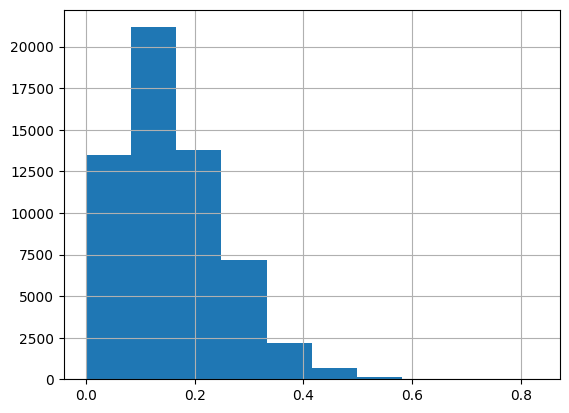

In [ ]:
#plot
loan_work['Loan-to-Income Ratio (LTI)'].hist()

In [ ]:
#show the scatter plot of loan to income ratio
import plotly.express as px

lti_scatter = px.scatter(loan_work, y='Loan-to-Income Ratio (LTI)', title='Scatter Plot of Loan-to-Income Ratio (LTI)')
lti_scatter.show()

In [ ]:
#find nan values
loan_work[loan_work['Loan-to-Income Ratio (LTI)'].isna()]

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE


In [ ]:
# Calculate quartiles for Loan-to-Income Ratio (LTI)
Q1_lti = loan_work['Loan-to-Income Ratio (LTI)'].quantile(0.25)
Q3_lti = loan_work['Loan-to-Income Ratio (LTI)'].quantile(0.75)
IQR_lti = Q3_lti - Q1_lti

# Define outlier bounds
lower_bound_lti = Q1_lti - 1.5 * IQR_lti
upper_bound_lti = Q3_lti + 1.5 * IQR_lti

# Identify outliers
outliers_lti = loan_work[(loan_work['Loan-to-Income Ratio (LTI)'] < lower_bound_lti) | (loan_work['Loan-to-Income Ratio (LTI)'] > upper_bound_lti)]

print(f"1st Quartile (Q1) of Loan-to-Income Ratio (LTI): {Q1_lti}")
print(f"3rd Quartile (Q3) of Loan-to-Income Ratio (LTI): {Q3_lti}")
print(f"IQR of Loan-to-Income Ratio (LTI): {IQR_lti}")
print(f"Lower Bound for Outliers: {lower_bound_lti}")
print(f"Upper Bound for Outliers: {upper_bound_lti}")
print(f"Number of outliers in Loan-to-Income Ratio (LTI): {len(outliers_lti)}")
print(f"Percentage of outliers in Loan-to-Income Ratio (LTI): {len(outliers_lti) / len(loan_work) * 100:.2f}%")

# Optionally, visualize with a box plot to clearly show outliers
lti_boxplot = px.box(loan_work, y='Loan-to-Income Ratio (LTI)', title='Box Plot of Loan-to-Income Ratio (LTI) with Outliers')
lti_boxplot.show()

1st Quartile (Q1) of Loan-to-Income Ratio (LTI): 0.09
3rd Quartile (Q3) of Loan-to-Income Ratio (LTI): 0.21
IQR of Loan-to-Income Ratio (LTI): 0.12
Lower Bound for Outliers: -0.09
Upper Bound for Outliers: 0.39
Number of outliers in Loan-to-Income Ratio (LTI): 1210
Percentage of outliers in Loan-to-Income Ratio (LTI): 2.07%


#>> CREDIT HISTORY LENGTH

In [ ]:
#Show credit history stats
loan_work['Credit History'].describe()

,Credit History
count,58543.000000
mean,5.798063
std,3.995985
min,2.000000
25%,3.000000
50%,4.000000
75%,8.000000
max,30.000000


In [ ]:
#show unique values
loan_work['Credit History'].unique()

array([ 4,  3, 11, 14, 13, 17, 12, 16, 15, 10,  6,  2,  8,  5,  7,  9, 27,
       30, 22, 19, 20, 23, 18, 28, 29, 25, 24, 21, 26])

In [ ]:
#plot credit history
credit_history_hist = px.histogram(loan_work, x='Credit History', title='Distribution of Credit History Length')
credit_history_hist.show()

NameError: name 'px' is not defined

In [ ]:
#read loan_clean
loan_clean = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_clean.csv')

In [ ]:
loan_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58543 entries, 0 to 58542
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58543 non-null  int64  
 1   Income                         58543 non-null  int64  
 2   Employment Length              58543 non-null  int64  
 3   Loan Amount                    58543 non-null  int64  
 4   Loan Interest Rate             58543 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58543 non-null  float64
 6   Payment Default on File        58543 non-null  int64  
 7   Credit History                 58543 non-null  int64  
 8   Loan Approval Status           58542 non-null  object 
 9   Max Loan Amount                58543 non-null  int64  
 10  Home_MORTGAGE                  58543 non-null  float64
 11  Home_OTHER                     58543 non-null  float64
 12  Home_OWN                       58543 non-null 

#>>>>>>>>>>>>>LOAN CLEAN<<<<<<<<

In [ ]:
#describe credit history length in loan clean
loan_clean['Credit History'].describe()

,Credit History
count,58543.000000
mean,5.798063
std,3.995985
min,2.000000
25%,3.000000
50%,4.000000
75%,8.000000
max,30.000000


In [ ]:
#show unique values of credit history length
loan_clean['Credit History'].unique()

array([ 4,  3, 11, 14, 13, 17, 12, 16, 15, 10,  6,  2,  8,  5,  7,  9, 27,
       30, 22, 19, 20, 23, 18, 28, 29, 25, 24, 21, 26])

In [ ]:
#find nan or NaN values ni credit history length
#data type of credit history length
loan_clean['Credit History'].dtype

dtype('int64')

In [ ]:
#plot the credit history length
credit_history_hist = px.histogram(loan_clean, x='Credit History', title='Distribution of Credit History Length')
credit_history_hist.show()

In [ ]:
#Loan_clean info, describe, isna, to ensure if it's a complete case
loan_clean.info()
loan_clean.describe()
loan_clean.isna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 58542 entries, 0 to 58542
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58542 non-null  int64  
 1   Income                         58542 non-null  int64  
 2   Employment Length              58542 non-null  int64  
 3   Loan Amount                    58542 non-null  int64  
 4   Loan Interest Rate             58542 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58542 non-null  float64
 6   Payment Default on File        58542 non-null  int64  
 7   Credit History                 58542 non-null  int64  
 8   Loan Approval Status           58542 non-null  object 
 9   Max Loan Amount                58542 non-null  int64  
 10  Home_MORTGAGE                  58542 non-null  float64
 11  Home_OTHER                     58542 non-null  float64
 12  Home_OWN                       58542 non-null  floa

,0
Age,0
Income,0
Employment Length,0
Loan Amount,0
Loan Interest Rate,0
Loan-to-Income Ratio (LTI),0
Payment Default on File,0
Credit History,0
Loan Approval Status,0
Max Loan Amount,0


In [ ]:
#show null value of loan approval status
loan_clean[loan_clean['Loan Approval Status'].isna()]

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
8717,22,9600,4,3500,12.18,0.36,0,2,NaN,7047,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
#drop that row with null value
loan_clean.dropna(subset=['Loan Approval Status'], inplace=True)
loan_clean.isna().sum()
#loan_clean[loan_clean['Loan Approval Status'].isna()]

,0
Age,0
Income,0
Employment Length,0
Loan Amount,0
Loan Interest Rate,0
Loan-to-Income Ratio (LTI),0
Payment Default on File,0
Credit History,0
Loan Approval Status,0
Max Loan Amount,0


#Loan Approval Status

In [ ]:
from plotly.io import show
#read loan_clean
loan_clean = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_clean.csv')
#show the histogram of loan approval status
loan_approval_hist = px.histogram(loan_clean, x='Loan Approval Status', title='Distribution of Loan Approval Status')
loan_approval_hist.show()

In [ ]:
#Show the scatter plot of loan approval status
loan_approval_scatter = px.scatter(loan_clean, y='Loan Approval Status')
loan_approval_scatter.show()

In [ ]:
loan_clean['Loan Approval Status'].describe()

,Loan Approval Status
count,58542
unique,8
top,Approved
freq,50123


In [ ]:
#show unique values of loan approval status
loan_clean['Loan Approval Status'].unique()

array(['Approved', 'APPROVED', 'APPROVED ', 'Declined ', 'DECLINED ',
       'Reject', nan, 'Accept', 'Accept '], dtype=object)

In [ ]:
loan_clean['Loan Approval Status'].unique()

array(['Approved', 'APPROVED', 'APPROVED ', 'Declined ', 'DECLINED ',
       'Reject', nan, 'Accept', 'Accept '], dtype=object)

In [ ]:
#drop null value
loan_clean.dropna(subset=['Loan Approval Status'], inplace=True)
loan_clean.isna().sum()

,0
Age,0
Income,0
Employment Length,0
Loan Amount,0
Loan Interest Rate,0
Loan-to-Income Ratio (LTI),0
Payment Default on File,0
Credit History,0
Loan Approval Status,0
Max Loan Amount,0


In [ ]:
#show unique value
loan_clean['Loan Approval Status'].unique()

array(['Approved', 'APPROVED', 'APPROVED ', 'Declined ', 'DECLINED ',
       'Reject', 'Accept', 'Accept '], dtype=object)

In [ ]:
loan_clean['Loan Approval Status'] = loan_clean['Loan Approval Status'].str.strip()
loan_clean['Loan Approval Status'] = loan_clean['Loan Approval Status'].replace({'Approved': 'Y', 'APPROVED': 'Y', 'Accept': 'Y', 'Accept ': 'Y', 'Declined': 'N', 'DECLINED': 'N', 'Reject': 'N'})
loan_clean['Loan Approval Status'].unique()

array(['Y', 'N'], dtype=object)

In [ ]:
#drop null value
loan_clean.dropna(subset=['Loan Approval Status'], inplace=True)
loan_clean.isna().sum()
loan_clean['Loan Approval Status'].unique()

array(['Y', 'N'], dtype=object)

In [ ]:
#enode the Y and N to 0 and 1
loan_clean['Loan Approval Status'] = loan_clean['Loan Approval Status'].map({'Y': 0, 'N': 1})
loan_clean['Loan Approval Status'].unique()

array([0, 1])

In [ ]:
#show histogram of loan approval status
import plotly.express as px

loan_approval_hist = px.histogram(loan_clean, x='Loan Approval Status', title='Distribution of Loan Approval Status (0=Declined, 1=Approved)')
loan_approval_hist.update_layout(xaxis_title='Loan Approval Status', yaxis_title='Count')
loan_approval_hist.show()

In [ ]:
#label encode the Y and N with 1 for Y and 0 for N
loan_clean['Loan Approval Status'] = loan_clean['Loan Approval Status'].map({'Y': 0, 'N': 1})
loan_clean['Loan Approval Status'].unique()

array([ 0.,  1., nan])

In [ ]:
#show unique values
loan_clean['Loan Approval Status'].unique()

array([ 0.,  1., nan])

In [ ]:
#drop null value
loan_clean.dropna(subset=['Loan Approval Status'], inplace=True)
loan_clean.isna().sum()

,0
Age,0
Income,0
Employment Length,0
Loan Amount,0
Loan Interest Rate,0
Loan-to-Income Ratio (LTI),0
Payment Default on File,0
Credit History,0
Loan Approval Status,0
Max Loan Amount,0


In [ ]:
#show unique values
loan_clean['Loan Approval Status'].unique()

array([0., 1.])

In [ ]:
#convert integer to float
loan_clean['Loan Approval Status'] = loan_clean['Loan Approval Status'].astype(float)
loan_clean['Loan Approval Status'].unique()

array([0., 1.])

In [ ]:
#Describe loan clean approval status
loan_clean['Loan Approval Status'].describe()

,Loan Approval Status
count,58542.000000
mean,0.857624
std,0.349439
min,0.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,1.000000


In [ ]:
print("Distribution of Loan Approval Status:")
display(loan_clean['Loan Approval Status'].value_counts())

print("\nPercentage distribution of Loan Approval Status:")
display(loan_clean['Loan Approval Status'].value_counts(normalize=True) * 100)

# Visualize the distribution with a histogram
loan_approval_distribution = px.histogram(loan_clean, x='Loan Approval Status', title='Distribution of Loan Approval Status (0=Declined, 1=Approved)')
loan_approval_distribution.update_layout(xaxis_title='Loan Approval Status', yaxis_title='Count')
loan_approval_distribution.show()

Distribution of Loan Approval Status:


,count
Loan Approval Status,
1,50207
0,8335



Percentage distribution of Loan Approval Status:


,proportion
Loan Approval Status,
1,85.762359
0,14.237641


In [ ]:
#loan approval status describe
loan_clean['Loan Approval Status'].describe()

,Loan Approval Status
count,0.0
mean,NaN
std,NaN
min,NaN
25%,NaN
50%,NaN
75%,NaN
max,NaN


In [ ]:
#roll back to 1 and 0 values
loan_clean['Loan Approval Status'].unique()

array([nan])

#PAYMENT DEFAULT


In [ ]:
from plotly.io import show
#read loan_clean
loan_clean = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_clean.csv')
#show the histogram of defult on file
payment_default_hist = px.histogram(loan_clean, x='Payment Default on File', title='Distribution of Payment Default on File')
payment_default_hist.show()

In [ ]:
#flip the 1 and 0
loan_clean['Payment Default on File'] = 1 - loan_clean['Payment Default on File']
#plot histogram of payment default on file
payment_default_hist = px.histogram(loan_clean, x='Payment Default on File', title='Distribution of Payment Default on File')
payment_default_hist.show()


#>>>>>>>>>>>>>>>>>>> FFFIINAALLL COOODDDEEEEE<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<

In [ ]:
#show the complete case of loan_clean
loan_clean.info()
loan_clean.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 58542 entries, 0 to 58542
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58542 non-null  int64  
 1   Income                         58542 non-null  int64  
 2   Employment Length              58542 non-null  int64  
 3   Loan Amount                    58542 non-null  int64  
 4   Loan Interest Rate             58542 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58542 non-null  float64
 6   Payment Default on File        58542 non-null  int64  
 7   Credit History                 58542 non-null  int64  
 8   Loan Approval Status           58542 non-null  int64  
 9   Max Loan Amount                58542 non-null  int64  
 10  Home_MORTGAGE                  58542 non-null  float64
 11  Home_OTHER                     58542 non-null  float64
 12  Home_OWN                       58542 non-null  floa

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
count,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,5.854200e+04,58542.000000,58542.000000,58542.00000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000,58542.000000
mean,27.512692,63534.434782,4.703205,9216.846059,10.677824,0.159315,0.148475,5.798128,0.142376,2.819765e+05,0.423303,0.001520,0.05350,0.521677,0.155888,0.209405,0.107137,0.186413,0.170373,0.170783
std,5.901711,31419.115236,4.002596,5562.795224,3.034606,0.091657,0.355573,3.995989,0.349439,5.153004e+07,0.494087,0.038961,0.22503,0.499534,0.362752,0.406888,0.309290,0.389443,0.375964,0.376323
min,20.000000,5000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000,0.000000,-2.426900e+06,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,0.000000,3.800525e+04,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,0.000000,6.238100e+04,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,0.000000,9.253900e+04,1.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,64.000000,400000.000000,150.000000,35000.000000,23.220000,0.830000,1.000000,30.000000,1.000000,1.246799e+10,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#>>>EMPLOYMENT LENGTH<<<<<

In [ ]:
#show histogram of employment length
employment_length_hist = px.histogram(loan_clean, x='Employment Length', title='Distribution of Employment Length')
employment_length_hist.show()

In [ ]:
#Find null values
loan_clean[loan_clean['Employment Length'].isna()]

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE


In [ ]:
#find outliers in employment length using quartiles
# Calculate quartiles for 'Employment Length'
Q1_employment_length = loan_clean['Employment Length'].quantile(0.25)
Q3_employment_length = loan_clean['Employment Length'].quantile(0.75)
IQR_employment_length = Q3_employment_length - Q1_employment_length

# Define outlier bounds
lower_bound_employment_length = Q1_employment_length - 1.5 * IQR_employment_length
upper_bound_employment_length = Q3_employment_length + 1.5 * IQR_employment_length

# Identify outliers
outliers_employment_length = loan_clean[
    (loan_clean['Employment Length'] < lower_bound_employment_length) |
    (loan_clean['Employment Length'] > upper_bound_employment_length)
]

print(f"1st Quartile (Q1) of Employment Length: {Q1_employment_length}")
print(f"3rd Quartile (Q3) of Employment Length: {Q3_employment_length}")
print(f"IQR of Employment Length: {IQR_employment_length}")
print(f"Lower Bound for Outliers: {lower_bound_employment_length}")
print(f"Upper Bound for Outliers: {upper_bound_employment_length}")
print(f"Number of outliers in Employment Length: {len(outliers_employment_length)}")
print(f"Percentage of outliers in Employment Length: {len(outliers_employment_length) / len(loan_clean) * 100:.2f}%")

# Visualize with a box plot to clearly show outliers
employment_length_boxplot = px.box(loan_clean, y='Employment Length', title='Box Plot of Employment Length with Outliers')
employment_length_boxplot.show()


1st Quartile (Q1) of Employment Length: 2.0
3rd Quartile (Q3) of Employment Length: 7.0
IQR of Employment Length: 5.0
Lower Bound for Outliers: -5.5
Upper Bound for Outliers: 14.5
Number of outliers in Employment Length: 1269
Percentage of outliers in Employment Length: 2.17%


In [ ]:
#find the percentage of outliers data
len(outliers_employment_length) / len(loan_clean) * 100
#remove anything above 41
loan_clean = loan_clean[loan_clean['Employment Length'] <= 41]


In [ ]:
#describe the employment length
loan_clean['Employment Length'].describe()

,Employment Length
count,58539.000000
mean,4.696681
std,3.896510
min,0.000000
25%,2.000000
50%,4.000000
75%,7.000000
max,41.000000


In [ ]:
loan_clean.info()
loan_clean.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 58539 entries, 0 to 58542
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58539 non-null  int64  
 1   Income                         58539 non-null  int64  
 2   Employment Length              58539 non-null  int64  
 3   Loan Amount                    58539 non-null  int64  
 4   Loan Interest Rate             58539 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58539 non-null  float64
 6   Payment Default on File        58539 non-null  int64  
 7   Credit History                 58539 non-null  int64  
 8   Loan Approval Status           58539 non-null  int64  
 9   Max Loan Amount                58539 non-null  int64  
 10  Home_MORTGAGE                  58539 non-null  float64
 11  Home_OTHER                     58539 non-null  float64
 12  Home_OWN                       58539 non-null  floa

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Max Loan Amount,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
count,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,5.853900e+04,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000
mean,27.512906,63532.970003,4.696681,9216.524061,10.677658,0.159315,0.148448,5.798220,0.142367,2.819874e+05,0.423290,0.001520,0.053503,0.521686,0.155896,0.209416,0.107142,0.186389,0.170382,0.170775
std,5.901739,31415.005829,3.896510,5562.285265,3.034568,0.091655,0.355547,3.996053,0.349429,5.153136e+07,0.494085,0.038962,0.225036,0.499534,0.362760,0.406895,0.309297,0.389423,0.375971,0.376315
min,20.000000,5000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000,0.000000,-2.426900e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,0.000000,3.801700e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,0.000000,6.238100e+04,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,0.000000,9.253700e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,64.000000,400000.000000,41.000000,35000.000000,23.220000,0.830000,1.000000,30.000000,1.000000,1.246799e+10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
loan_clean.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_2.csv', index=False)
print("DataFrame 'loan_clean' successfully saved as 'loan_2.csv' in Google Drive.")

DataFrame 'loan_clean' successfully saved as 'loan_2.csv' in Google Drive.


In [ ]:
#drop max loan amount variable from the loan_clean file
loan_clean = loan_clean.drop(columns=['Max Loan Amount'])
#show describe
loan_clean.describe()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
count,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000
mean,27.512906,63532.970003,4.696681,9216.524061,10.677658,0.159315,0.148448,5.798220,0.142367,0.423290,0.001520,0.053503,0.521686,0.155896,0.209416,0.107142,0.186389,0.170382,0.170775
std,5.901739,31415.005829,3.896510,5562.285265,3.034568,0.091655,0.355547,3.996053,0.349429,0.494085,0.038962,0.225036,0.499534,0.362760,0.406895,0.309297,0.389423,0.375971,0.376315
min,20.000000,5000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,64.000000,400000.000000,41.000000,35000.000000,23.220000,0.830000,1.000000,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#MODELINGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG


In [ ]:
#save loan_clean to new csv in the drive
loan_clean.to_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_model.csv', index=False)
print("DataFrame 'loan_clean' successfully saved as 'loan_2.csv' in Google Drive.")

DataFrame 'loan_clean' successfully saved as 'loan_2.csv' in Google Drive.


In [ ]:
#read loan_model
loan_model = pd.read_csv('/content/drive/MyDrive/MSc. Data analytics - UoW - University of Westminster/Semester 1/Data Mining and Machine Learning/Course Work /loan_model.csv')
loan_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58539 entries, 0 to 58538
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            58539 non-null  int64  
 1   Income                         58539 non-null  int64  
 2   Employment Length              58539 non-null  int64  
 3   Loan Amount                    58539 non-null  int64  
 4   Loan Interest Rate             58539 non-null  float64
 5   Loan-to-Income Ratio (LTI)     58539 non-null  float64
 6   Payment Default on File        58539 non-null  int64  
 7   Credit History                 58539 non-null  int64  
 8   Loan Approval Status           58539 non-null  int64  
 9   Home_MORTGAGE                  58539 non-null  float64
 10  Home_OTHER                     58539 non-null  float64
 11  Home_OWN                       58539 non-null  float64
 12  Home_RENT                      58539 non-null 

In [ ]:

loan_model.describe()

,Age,Income,Employment Length,Loan Amount,Loan Interest Rate,Loan-to-Income Ratio (LTI),Payment Default on File,Credit History,Loan Approval Status,Home_MORTGAGE,Home_OTHER,Home_OWN,Home_RENT,Loan Intent_DEBTCONSOLIDATION,Loan Intent_EDUCATION,Loan Intent_HOMEIMPROVEMENT,Loan Intent_MEDICAL,Loan Intent_PERSONAL,Loan Intent_VENTURE
count,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000,58539.000000
mean,27.512906,63532.970003,4.696681,9216.524061,10.677658,0.159315,0.148448,5.798220,0.142367,0.423290,0.001520,0.053503,0.521686,0.155896,0.209416,0.107142,0.186389,0.170382,0.170775
std,5.901739,31415.005829,3.896510,5562.285265,3.034568,0.091655,0.355547,3.996053,0.349429,0.494085,0.038962,0.225036,0.499534,0.362760,0.406895,0.309297,0.389423,0.375971,0.376315
min,20.000000,5000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,42000.000000,2.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,58000.000000,4.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,75500.000000,7.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,64.000000,400000.000000,41.000000,35000.000000,23.220000,0.830000,1.000000,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
